# Adults Income Prediction

**Context**
Gender is a social construct. The way males and females are treated differently since birth moulds their behaviour and personal preferences into what society expects for their gender.

This small dataset is designed to provide an idea about whether a person's gender can be predicted with an accuracy significantly above 50% based on their personal preferences.

In [162]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [163]:
import warnings
warnings.filterwarnings("ignore")

## importing dataset for classification

In [164]:
dataset=pd.read_csv("adult.csv")
dataset.head()

,age,workclass,fnlwgt,education,educational-num,marital_status,occupation,relationship,race,gender,capital_gain,capital_loss,hours_per_week,native_country,income
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,18,?,103497,Some-college,10,Never-married,?,Own-child,White,Female,0,0,30,United-States,<=50K


In [4]:
#give information about null values and data type
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   age              48842 non-null  int64 
 1   workclass        48842 non-null  object
 2   fnlwgt           48842 non-null  int64 
 3   education        48842 non-null  object
 4   educational-num  48842 non-null  int64 
 5   marital_status   48842 non-null  object
 6   occupation       48842 non-null  object
 7   relationship     48842 non-null  object
 8   race             48842 non-null  object
 9   gender           48842 non-null  object
 10  capital_gain     48842 non-null  int64 
 11  capital_loss     48842 non-null  int64 
 12  hours_per_week   48842 non-null  int64 
 13  native_country   48842 non-null  object
 14  income           48842 non-null  object
dtypes: int64(6), object(9)
memory usage: 5.6+ MB


In [5]:
#checking count of each unique rows
dataset['income'].value_counts()

<=50K    37155
>50K     11687
Name: income, dtype: int64

In [6]:
dataset.describe()

,age,fnlwgt,educational-num,capital_gain,capital_loss,hours_per_week
count,48842.000000,4.884200e+04,48842.000000,48842.000000,48842.000000,48842.000000
mean,38.643585,1.896641e+05,10.078089,1079.067626,87.502314,40.422382
std,13.710510,1.056040e+05,2.570973,7452.019058,403.004552,12.391444
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.175505e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.781445e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.376420e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.490400e+06,16.000000,99999.000000,4356.000000,99.000000


In [7]:
#last five rows
dataset.tail()

,age,workclass,fnlwgt,education,educational-num,marital_status,occupation,relationship,race,gender,capital_gain,capital_loss,hours_per_week,native_country,income
48837,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
48838,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
48839,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
48840,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K
48841,52,Self-emp-inc,287927,HS-grad,9,Married-civ-spouse,Exec-managerial,Wife,White,Female,15024,0,40,United-States,>50K


In [8]:
#checking null values total
dataset.isna().sum()

age                0
workclass          0
fnlwgt             0
education          0
educational-num    0
marital_status     0
occupation         0
relationship       0
race               0
gender             0
capital_gain       0
capital_loss       0
hours_per_week     0
native_country     0
income             0
dtype: int64

In [9]:
X = dataset.drop('income' , axis =1)
y= dataset["income"]

 # Exploratory data analysis

Text(0.5, 1.0, 'income base on age and workclass')

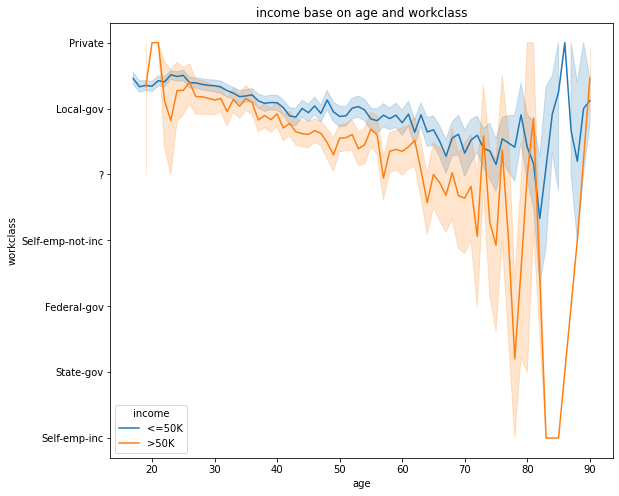

In [10]:
plt.figure(figsize=(9,8))
sns.lineplot(x="age",y="workclass",data=dataset,hue="income")
plt.title("income base on age and workclass")

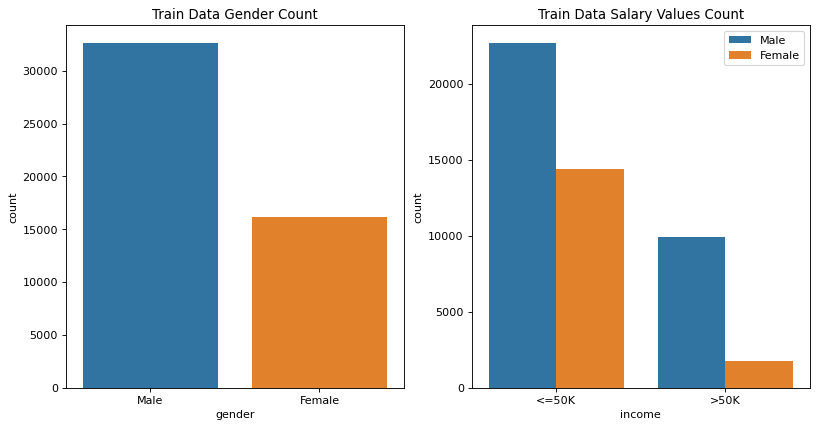

In [17]:
plt.figure(dpi=80, figsize=(12, 6))

plt.subplot(121)
sns.countplot(x="gender", data=dataset)
plt.title("Train Data Gender Count")
plt.xticks([0, 1], ["Male", "Female"])

plt.subplot(122)
sns.countplot(x="income", hue="gender", data=dataset)
plt.title("Train Data Salary Values Count")
plt.legend(["Male", "Female"])

plt.show()

Most of the People have less than 50K salary
Most of the People with more than 50K salary are women

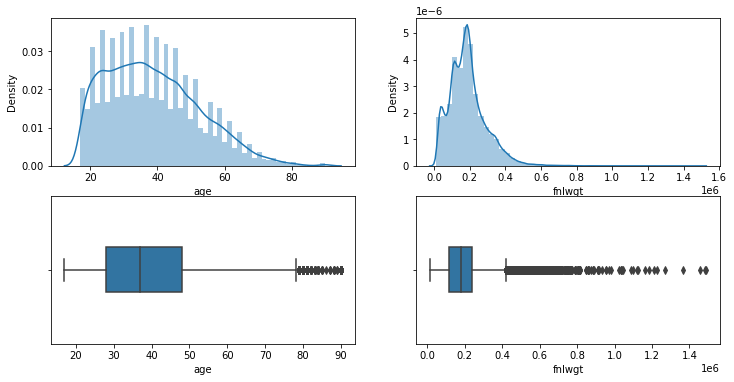

In [20]:
plt.figure(figsize=(12, 6))

plt.subplot(221)
sns.distplot(dataset.age)

plt.subplot(222)
sns.distplot(dataset.fnlwgt)

plt.subplot(223)
sns.boxplot(dataset.age, width=0.3)

plt.subplot(224)
sns.boxplot(dataset.fnlwgt, width=0.3)
plt.show()

The data for age and final weight is right skewed¶

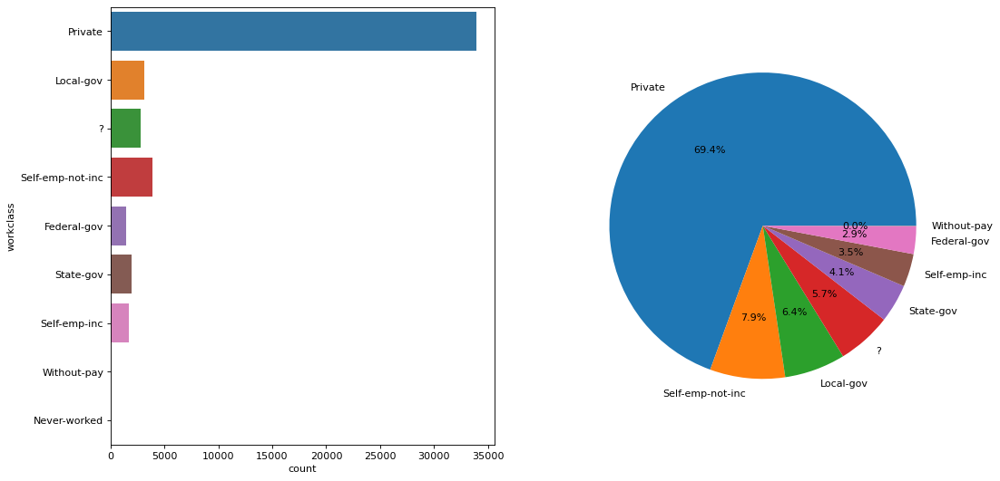

In [23]:
plt.figure(dpi=80, figsize=(15, 8))

plt.subplot(121)
sns.countplot(y=dataset.workclass)

plt.subplot(122)
plt.pie(dataset.workclass.value_counts()[:-1], autopct='%.1f%%', labels=dataset.workclass.value_counts().index[:-1])

plt.show()

In [27]:
dataset.loc[dataset.income == ">50K"].groupby("workclass")["income"].value_counts()

workclass         income
?                 >50K       265
Federal-gov       >50K       561
Local-gov         >50K       927
Private           >50K      7387
Self-emp-inc      >50K       938
Self-emp-not-inc  >50K      1077
State-gov         >50K       530
Without-pay       >50K         2
Name: income, dtype: int64

Most of the people that have higher than 50K salary work in Privare Sector

In [30]:
dataset.loc[dataset.income != ">50K"].groupby("workclass")["income"].value_counts()

workclass         income
?                 <=50K      2534
Federal-gov       <=50K       871
Local-gov         <=50K      2209
Never-worked      <=50K        10
Private           <=50K     26519
Self-emp-inc      <=50K       757
Self-emp-not-inc  <=50K      2785
State-gov         <=50K      1451
Without-pay       <=50K        19
Name: income, dtype: int64

Most of the people that have salary lower than 50K also work in Privare Sector

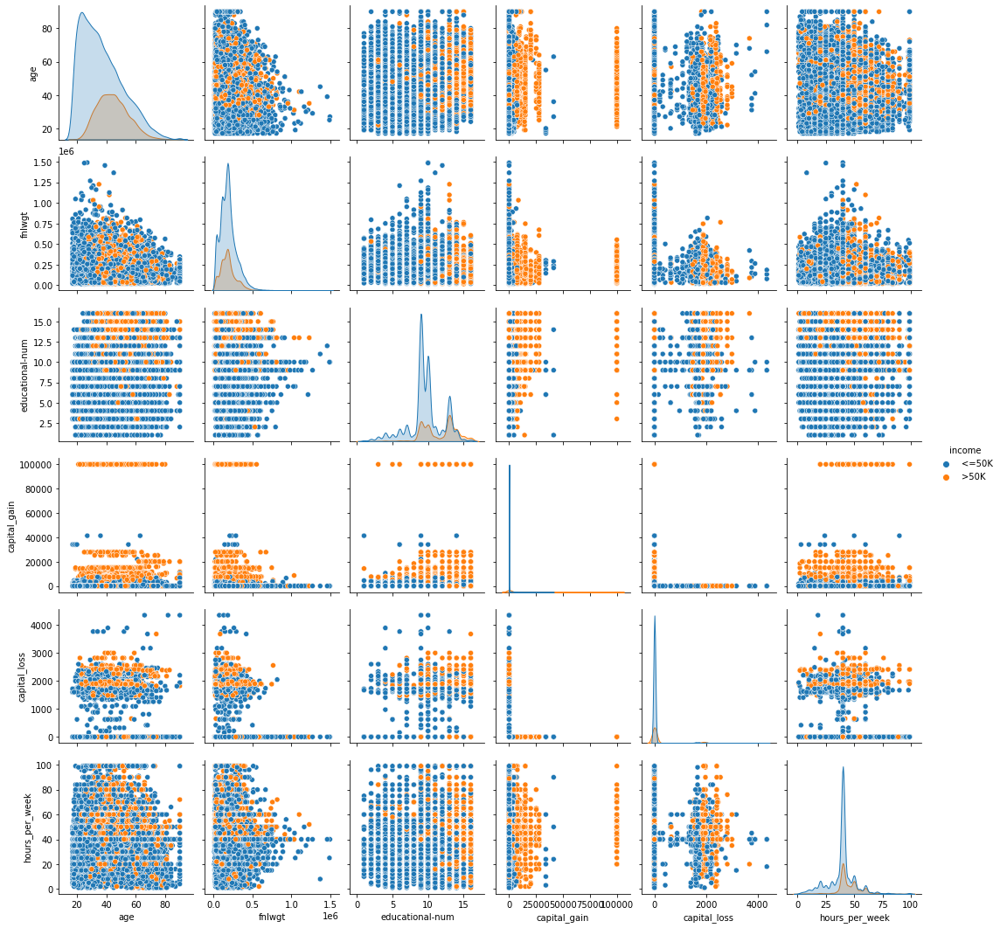

In [35]:
sns.pairplot(dataset, hue="income")
plt.show()

In [36]:
dataset["workclass"]=dataset["workclass"].replace("?","Private")

In [37]:
dataset["workclass"].value_counts()

Private             36705
Self-emp-not-inc     3862
Local-gov            3136
State-gov            1981
Self-emp-inc         1695
Federal-gov          1432
Without-pay            21
Never-worked           10
Name: workclass, dtype: int64

## Data preprocessing

In [38]:
# check how many columns we will get after one hot encoding these variable
pd.get_dummies(dataset,drop_first=True).shape

(48842, 100)

In [39]:
len(dataset["workclass"].unique())

8

In [40]:
len(dataset["education"].unique())

16

In [41]:
len(dataset["marital_status"].unique())

7

In [42]:
len(dataset["occupation"].unique())

15

In [43]:
len(dataset["relationship"].unique())

6

In [44]:
len(dataset["race"].unique())

5

In [46]:
len(dataset["gender"].unique())

2

In [47]:
len(dataset["native_country"].unique())

42

In [48]:
# lets see how many labels which variable has
for col in dataset.columns[0:]:
    print(col,':',len(dataset[col].unique()),'labels')

age : 74 labels
workclass : 8 labels
fnlwgt : 28523 labels
education : 16 labels
educational-num : 16 labels
marital_status : 7 labels
occupation : 15 labels
relationship : 6 labels
race : 5 labels
gender : 2 labels
capital_gain : 123 labels
capital_loss : 99 labels
hours_per_week : 96 labels
native_country : 42 labels
income : 2 labels


# Data preprocessing

### workclass

In [165]:
# top 10 most frequet categories for variable workclass
dataset.workclass.value_counts().sort_values(ascending=False).head(10)

Private             33906
Self-emp-not-inc     3862
Local-gov            3136
?                    2799
State-gov            1981
Self-emp-inc         1695
Federal-gov          1432
Without-pay            21
Never-worked           10
Name: workclass, dtype: int64

In [166]:
#obtain counts for each one of the labels in variable in variable use to remap the labels
dataset.workclass.value_counts().to_dict()

{'Private': 33906,
 'Self-emp-not-inc': 3862,
 'Local-gov': 3136,
 '?': 2799,
 'State-gov': 1981,
 'Self-emp-inc': 1695,
 'Federal-gov': 1432,
 'Without-pay': 21,
 'Never-worked': 10}

In [167]:
#replace each label into its count
#we make dictionary that map each label to the counts
freq_work=dataset.workclass.value_counts().to_dict()

In [168]:
# and now we are replacing workclass in the dataset
dataset.workclass=dataset.workclass.map(freq_work)

In [169]:
dataset.head()

,age,workclass,fnlwgt,education,educational-num,marital_status,occupation,relationship,race,gender,capital_gain,capital_loss,hours_per_week,native_country,income
0,25,33906,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,33906,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,3136,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,33906,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,18,2799,103497,Some-college,10,Never-married,?,Own-child,White,Female,0,0,30,United-States,<=50K


### Education

In [170]:
dataset.education.value_counts().sort_values(ascending=False).head(10)

HS-grad         15784
Some-college    10878
Bachelors        8025
Masters          2657
Assoc-voc        2061
11th             1812
Assoc-acdm       1601
10th             1389
7th-8th           955
Prof-school       834
Name: education, dtype: int64

In [171]:
freq_edu=dataset.education.value_counts().to_dict()

In [172]:
dataset.education=dataset.education.map(freq_edu)

### marital-status

In [173]:
dataset.marital_status.value_counts().sort_values(ascending=False).head(10)

Married-civ-spouse       22379
Never-married            16117
Divorced                  6633
Separated                 1530
Widowed                   1518
Married-spouse-absent      628
Married-AF-spouse           37
Name: marital_status, dtype: int64

In [174]:
freq_mar=dataset.marital_status.value_counts().to_dict()

In [175]:
dataset.marital_status=dataset.marital_status.map(freq_mar)

### occupation

In [176]:
dataset.occupation.value_counts().sort_values(ascending=False).head(10)

Prof-specialty       6172
Craft-repair         6112
Exec-managerial      6086
Adm-clerical         5611
Sales                5504
Other-service        4923
Machine-op-inspct    3022
?                    2809
Transport-moving     2355
Handlers-cleaners    2072
Name: occupation, dtype: int64

In [177]:
freq_occ=dataset.occupation.value_counts().to_dict()

In [178]:
dataset.occupation=dataset.occupation.map(freq_occ)

### relationship

In [179]:
dataset.relationship.value_counts().sort_values(ascending=False).head(10)
freq_rel=dataset.relationship.value_counts().to_dict()
dataset.relationship=dataset.relationship.map(freq_rel)

### race

In [180]:
dataset.race.value_counts().sort_values(ascending=False).head(10)
freq_race=dataset.race.value_counts().to_dict()
dataset.race=dataset.race.map(freq_race)

### gender

In [181]:
dataset['gender'].replace(['Female','Male'],[0,1],inplace=True)

### native_country

In [182]:
dataset.native_country.value_counts().sort_values(ascending=False).head(10)
freq_rel=dataset.native_country.value_counts().to_dict()
dataset.native_country=dataset.native_country.map(freq_rel)

### income

In [205]:
dataset["income"].replace(["<=50K",">50K"],[0,1],inplace=True)

# 1. KNN Model

In [70]:
x = dataset.drop('income',axis=1)
y=dataset["income"]

In [71]:
x=x.values

## train test split

In [73]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=0)

## Scalling

In [74]:
from sklearn.preprocessing import StandardScaler #
scaler= StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

## k=3

In [75]:
from sklearn.neighbors import KNeighborsClassifier

In [76]:
knn_3=KNeighborsClassifier(n_neighbors=3,metric="euclidean")
knn_3.fit(x_train,y_train)

KNeighborsClassifier(metric='euclidean', n_neighbors=3)

In [77]:
prediction=knn_3.predict(x_test)
prediction

array([0, 1, 0, ..., 1, 0, 0], dtype=int64)

In [79]:
y_test

38113    0
39214    1
44248    1
10283    0
26724    0
        ..
27608    1
25140    0
18962    0
36301    0
45837    0
Name: income, Length: 9769, dtype: int64

## computing accuracy

In [80]:
from sklearn.metrics import accuracy_score

In [81]:
accuracy=accuracy_score(y_test,prediction)

In [82]:
print("accuracy is test",accuracy)

accuracy is test 0.8210666393694339


In [83]:
train_pred=knn_3.predict(x_train)
train_accuracy=accuracy_score(y_train,train_pred)
print("training accuracy ",train_accuracy)

training accuracy  0.8993422568013718


In [84]:
dataset["income"].value_counts()

0    37155
1    11687
Name: income, dtype: int64

##  Finding optimal value of k

In [85]:
training_accuracy=[]
testing_accuracy=[]
for i in range(1,16,2):
    knn=KNeighborsClassifier(n_neighbors=i,metric="euclidean")
    knn.fit(x_train,y_train)

    train_pred=knn.predict(x_train)
    accuracy=accuracy_score(y_train,train_pred)
    training_accuracy.append(accuracy)

    test_pred=knn.predict(x_test)
    test_accuracy=accuracy_score(y_test,test_pred)
    testing_accuracy.append(test_accuracy)

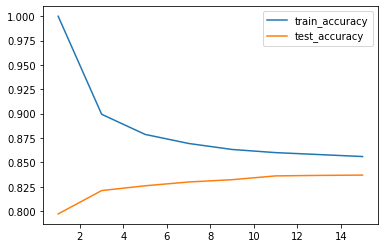

In [86]:
k_values = list(range(1,16,2))
plt.plot(k_values, training_accuracy)
plt.plot(k_values, testing_accuracy)
plt.legend(["train_accuracy", "test_accuracy"])

## fitting with optimal value of k=11


In [87]:
knn_11=KNeighborsClassifier(n_neighbors=11,metric="euclidean")
knn_11.fit(x_train,y_train)

test_pred=knn_11.predict(x_test)
test_accuracy=accuracy_score(y_test,test_pred)
print("testing accuracy is",test_accuracy)

train_pred=knn_11.predict(x_train)
train_accuracy=accuracy_score(y_train,train_pred)
print("training accuracy is",train_accuracy)

testing accuracy is 0.8361142389190296
training accuracy is 0.8600056304865252


#### Validation Split

#### 1. Simple train and validation split

In [88]:
X_train,X_val,y_train_new,y_val=train_test_split(x_train,y_train,test_size=0.3,random_state=0)

In [89]:
print("size of training data",X_train.shape[0])
print("size of validation data",X_val.shape[0])

size of training data 27351
size of validation data 11722


In [90]:
training_accuracy=[]
val_accuracy=[]
for i in range(1,16,2):
    knn=KNeighborsClassifier(n_neighbors=i,metric="euclidean")
    knn.fit(X_train,y_train_new)
    
    val_pred=knn.predict(X_val)
    val_accuracies=accuracy_score(y_val,val_pred)
    val_accuracy.append(val_accuracies)
    
    train_pred=knn.predict(X_train)
    train_accuracies=accuracy_score(y_train_new,train_pred)
    training_accuracy.append(train_accuracies)

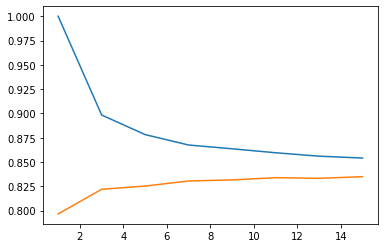

In [91]:
k_value=list(range(1,16,2))
plt.plot(k_value,training_accuracy)
plt.plot(k_value,val_accuracy)

### fitting with optimal value of k=13

In [92]:
knn_13=KNeighborsClassifier(n_neighbors=13,metric="euclidean")
knn_13.fit(x_train,y_train)

test_pred=knn_13.predict(x_test)
test_accuracy=accuracy_score(y_test,test_pred)
print("testing accuracy is",test_accuracy)

train_pred=knn_13.predict(x_train)
train_accuracy=accuracy_score(y_train,train_pred)
print("training accuracy is",train_accuracy)

testing accuracy is 0.8366260620329614
training accuracy is 0.8580093670821283


##  cross validation

In [93]:
from sklearn.model_selection import cross_validate

In [94]:
knn=KNeighborsClassifier(n_neighbors=5,metric="euclidean")

In [95]:
cv_result=cross_validate(knn,x_train,y_train,cv=4,return_train_score=True)
cv_result

{'fit_time': array([0.07379985, 0.07240462, 0.06301951, 0.05712819]),
 'score_time': array([3.0578413 , 4.39085722, 2.83877134, 2.81792355]),
 'test_score': array([0.82823216, 0.82698608, 0.82708845, 0.8285217 ]),
 'train_score': array([0.87984575, 0.87568674, 0.87868964, 0.87694933])}

In [96]:
print("training date average accuracy",cv_result['train_score'].mean()*100)
print("testing data average accuracy",cv_result['test_score'].mean()*100)

training date average accuracy 87.77928667953834
testing data average accuracy 82.77070988901781


### Hyper-parameter tuning using GridSearch


In [97]:
from sklearn.model_selection import GridSearchCV

In [98]:
knn = KNeighborsClassifier(metric = "euclidean")

In [99]:
param_grid  = {"n_neighbors" : np.arange(1,16,2)}

In [100]:
knn_with_gs = GridSearchCV(knn, param_grid, return_train_score = True, verbose =1, scoring = "accuracy")

In [101]:
knn_with_gs.fit(x_train,y_train)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


GridSearchCV(estimator=KNeighborsClassifier(metric='euclidean'),
             param_grid={'n_neighbors': array([ 1,  3,  5,  7,  9, 11, 13, 15])},
             return_train_score=True, scoring='accuracy', verbose=1)

In [102]:
knn_with_gs.cv_results_

{'mean_fit_time': array([0.08814836, 0.07031145, 0.0845593 , 0.08239393, 0.0800087 ,
        0.08951483, 0.07957773, 0.07981424]),
 'std_fit_time': array([0.01342546, 0.00928762, 0.0134798 , 0.00608172, 0.01574504,
        0.01602571, 0.01622066, 0.00169185]),
 'mean_score_time': array([1.88626928, 2.70045681, 3.34956985, 3.12254415, 3.85442715,
        4.2837883 , 4.18407393, 4.11888661]),
 'std_score_time': array([0.2816973 , 0.27037274, 0.22781487, 0.14166185, 0.44303173,
        0.62358994, 0.60497302, 0.39403304]),
 'param_n_neighbors': masked_array(data=[1, 3, 5, 7, 9, 11, 13, 15],
              mask=[False, False, False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'n_neighbors': 1},
  {'n_neighbors': 3},
  {'n_neighbors': 5},
  {'n_neighbors': 7},
  {'n_neighbors': 9},
  {'n_neighbors': 11},
  {'n_neighbors': 13},
  {'n_neighbors': 15}],
 'split0_test_score': array([0.79756878, 0.81394754, 0.82712732, 0.82891875, 0.8264875

In [103]:
df=pd.DataFrame(knn_with_gs.cv_results_)
df=df[["param_n_neighbors","mean_train_score","mean_test_score"]] 

In [104]:
knn_15=KNeighborsClassifier(n_neighbors=15,metric="euclidean")
knn_15.fit(x_train,y_train)
test_pred=knn_15.predict(x_test)
test_accuracy=accuracy_score(y_test,test_pred)
print("testing accuracy is",test_accuracy)

testing accuracy is 0.8369331559013206


### Evaluation measures

#### Confusion Matrix

In [106]:
from sklearn.metrics import confusion_matrix

In [107]:
cm=confusion_matrix(y_test,test_pred)
cm

array([[6846,  574],
       [1019, 1330]], dtype=int64)

In [108]:
pd.DataFrame(cm, columns = ["No", "Yes"], index = ["No", "Yes"])

,No,Yes
No,6846,574
Yes,1019,1330


#### Precision and Recall

In [109]:
from sklearn.metrics import precision_score, recall_score

In [110]:
precision_score(y_test,prediction)

0.6381609195402299

In [111]:
precision_score(y_test,test_pred, pos_label= 0)

0.870438652256834

In [112]:
precision_score(y_test,test_pred, pos_label= 1)

0.6985294117647058

In [113]:
recall_score(y_test,test_pred, pos_label= 0)

0.9226415094339623

In [114]:
recall_score(y_test,test_pred, pos_label= 1)

0.5661983822903364

# 2. Decision Tree

In [135]:
dataset.head()

,age,workclass,fnlwgt,education,educational-num,marital_status,occupation,relationship,race,gender,capital_gain,capital_loss,hours_per_week,native_country,income
0,25,33906,226802,1812,7,16117,3022,7581,4685,1,0,0,40,43832,<=50K
1,38,33906,89814,15784,9,22379,1490,19716,41762,1,0,0,50,43832,<=50K
2,28,3136,336951,1601,12,22379,983,19716,41762,1,0,0,40,43832,>50K
3,44,33906,160323,10878,10,22379,3022,19716,4685,1,7688,0,40,43832,>50K
4,18,2799,103497,10878,10,16117,2809,7581,41762,0,0,0,30,43832,<=50K


In [136]:
x=dataset.drop('income',axis=1)
y=dataset['income']

In [137]:
from sklearn.tree import DecisionTreeClassifier

In [138]:
decision_tree=DecisionTreeClassifier(random_state=0)
decision_tree.fit(x,y)

DecisionTreeClassifier(random_state=0)

In [139]:
prediction=decision_tree.predict(x)
prediction

array(['<=50K', '<=50K', '>50K', ..., '<=50K', '<=50K', '>50K'],
      dtype=object)

In [140]:
from sklearn.tree import export_graphviz
import graphviz

In [141]:
import os
os.environ["PATH"]+=os.pathsep +'C:/Program Files/Graphviz/bin/'

In [142]:
viz_data=export_graphviz(decision_tree,feature_names=x.columns,class_names=decision_tree.classes_)
tree=graphviz.Source(viz_data)
tree

In [143]:
### Hyperparameter tuning

#### max_depth

In [144]:
dt_clf=DecisionTreeClassifier(max_depth=2,random_state=0)
dt_clf.fit(x,y)

DecisionTreeClassifier(max_depth=2, random_state=0)

In [145]:
prediction=dt_clf.predict(x)
print("accuracy is",accuracy_score(y,prediction))

accuracy is 0.8290405798288358


In [146]:
max_depth_range=list(range(1,6))
accuracy=[]
for i in max_depth_range:
    df_clf=DecisionTreeClassifier(max_depth=i,random_state=0)
    df_clf.fit(x,y)
    prediction=df_clf.predict(x)
    ac=accuracy_score(y,prediction)
    accuracy.append(ac)

Text(0, 0.5, 'accuracy')

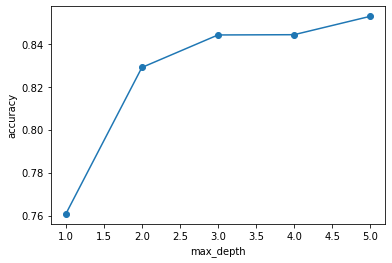

In [147]:
plt.plot(max_depth_range,accuracy,marker='o')
plt.xlabel("max_depth")
plt.ylabel("accuracy")

 # Random Forest

In [148]:
dataset.head()

,age,workclass,fnlwgt,education,educational-num,marital_status,occupation,relationship,race,gender,capital_gain,capital_loss,hours_per_week,native_country,income
0,25,33906,226802,1812,7,16117,3022,7581,4685,1,0,0,40,43832,<=50K
1,38,33906,89814,15784,9,22379,1490,19716,41762,1,0,0,50,43832,<=50K
2,28,3136,336951,1601,12,22379,983,19716,41762,1,0,0,40,43832,>50K
3,44,33906,160323,10878,10,22379,3022,19716,4685,1,7688,0,40,43832,>50K
4,18,2799,103497,10878,10,16117,2809,7581,41762,0,0,0,30,43832,<=50K


In [149]:
print("size of data",dataset.shape)

size of data (48842, 15)


In [150]:
dataset["income"].value_counts()

<=50K    37155
>50K     11687
Name: income, dtype: int64

In [151]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=0)

In [152]:
print("size of training data",x_train.shape[0])
print("size of testing data",x_test.shape[0])

size of training data 34189
size of testing data 14653


In [153]:
from sklearn.ensemble import RandomForestClassifier

In [154]:
clf=RandomForestClassifier(n_estimators=5)
clf.fit(x_train,y_train)


RandomForestClassifier(n_estimators=5)

In [155]:
y_pred=clf.predict(x_test)
y_pred

array(['>50K', '>50K', '<=50K', ..., '<=50K', '<=50K', '<=50K'],
      dtype=object)

In [156]:
#predicting accuracy
from sklearn.metrics import accuracy_score

In [157]:
print("accuracy is ",accuracy_score(y_test,y_pred))

accuracy is  0.8435815191428376


# 4. Logistic Regression


In [208]:
dataset.head()

,age,workclass,fnlwgt,education,educational-num,marital_status,occupation,relationship,race,gender,capital_gain,capital_loss,hours_per_week,native_country,income
0,25,33906,226802,1812,7,16117,3022,7581,4685,1,0,0,40,43832,0
1,38,33906,89814,15784,9,22379,1490,19716,41762,1,0,0,50,43832,0
2,28,3136,336951,1601,12,22379,983,19716,41762,1,0,0,40,43832,1
3,44,33906,160323,10878,10,22379,3022,19716,4685,1,7688,0,40,43832,1
4,18,2799,103497,10878,10,16117,2809,7581,41762,0,0,0,30,43832,0


In [184]:
print("size of dataset",dataset.shape)

size of dataset (48842, 15)


In [185]:
print("size of dataset",dataset.shape)

size of dataset (48842, 15)


In [186]:
dataset["income"].replace(["<=50K",">50K"],[0,1],inplace=True)

# age vs income

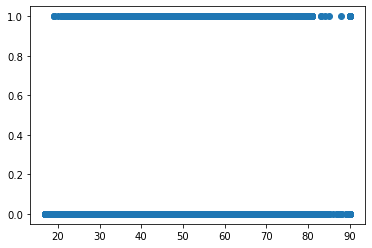

In [187]:
plt.scatter(dataset["age"],dataset["income"])

# train test split


In [188]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=0)

In [189]:
print("size of training data",x_train.shape[0])
print("size of testing data",x_test.shape[0])

size of training data 34189
size of testing data 14653


### fitting logistic regression model


In [213]:
from sklearn.linear_model import LogisticRegression

In [214]:
logistic_model=LogisticRegression()
logistic_model.fit(x_train,y_train)

LogisticRegression()

In [215]:
import warnings
warnings.filterwarnings("ignore")

In [216]:
prediction=logistic_model.predict(x_test)
prediction


array(['<=50K', '>50K', '<=50K', ..., '<=50K', '>50K', '<=50K'],
      dtype=object)

### predicting accuracy

In [217]:
from sklearn.metrics import accuracy_score

In [218]:
print("test accuracy is",logistic_model.score(x_test,y_test))

test accuracy is 0.7933528970176755


In [219]:
train_prediction=logistic_model.predict(x_train)

In [220]:
print("training accuracy is",logistic_model.score(x_train,y_train))

training accuracy is 0.7931498435169206


#### Getting the probabilites

In [221]:
x_test.iloc[0,:]

age                   36
workclass          33906
fnlwgt             65624
education           8025
educational-num       13
marital_status     16117
occupation          6172
relationship       12583
race               41762
gender                 1
capital_gain           0
capital_loss           0
hours_per_week        40
native_country     43832
Name: 38113, dtype: int64

In [222]:
logistic_model.predict_proba(x_test.iloc[0, :].values.reshape(1,-1))

array([[0.82297298, 0.17702702]])

In [223]:
pred_probs=logistic_model.predict_proba(x_test)
pred_probs

array([[0.82297298, 0.17702702],
       [0.39016868, 0.60983132],
       [0.64920198, 0.35079802],
       ...,
       [0.85163031, 0.14836969],
       [0.21584902, 0.78415098],
       [0.80097586, 0.19902414]])

### Log Loss

In [224]:
from sklearn.metrics import log_loss

In [225]:
print("log loss",log_loss(y_test,pred_probs))

log loss 0.4563527659710421


# Handling imbalance dataset


In [230]:
print("size of data",dataset.shape)

size of data (48842, 15)


In [231]:
print("target variable frequency distribution: \n",dataset["income"].value_counts())

target variable frequency distribution: 
 0    37155
1    11687
Name: income, dtype: int64


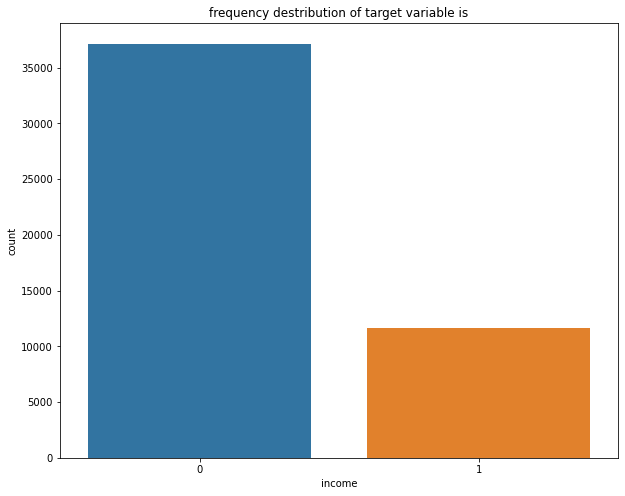

In [232]:
plt.figure(figsize = (10,8))
sns.countplot(dataset["income"])
plt.title("frequency destribution of target variable is")
plt.show()

# train test split

In [234]:
from sklearn.model_selection import train_test_split

In [235]:
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=0,test_size=0.2)

In [236]:
print("size of test data",x_test.shape[0])
print("size of training data",x_train.shape[0])

size of test data 9769
size of training data 39073


In [237]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

In [238]:
knn=KNeighborsClassifier(n_neighbors=5,metric='euclidean')
knn.fit(x_train,y_train)
prediction=knn.predict(x_test)
accuracy=accuracy_score(y_test,prediction)

In [239]:
accuracy

0.8015149964172382

In [240]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

### Sampling techniques to handle imbalanced dataset

#### 1. UnderSampling (DownSampling)

In [241]:
from imblearn.under_sampling import RandomUnderSampler

In [242]:
print("before under sampling\n",y_train.value_counts())

before under sampling
 <=50K    29735
>50K      9338
Name: income, dtype: int64


In [243]:
under_sampling = RandomUnderSampler(random_state=42,replacement=True)# fit predictor and target variable
x_train_under, y_train_under  = under_sampling.fit_resample(x_train, y_train)

In [244]:
print("after under sampling\n",y_train_under.value_counts())

after under sampling
 <=50K    9338
>50K     9338
Name: income, dtype: int64


In [245]:
knn=KNeighborsClassifier(n_neighbors=5,metric="euclidean")
knn.fit(x_train_under,y_train_under)
prediction=knn.predict(x_test)
accuracy=accuracy_score(y_test,prediction)
accuracy

0.7358992732111782

In [246]:
cm=confusion_matrix(y_test,prediction)
pd.DataFrame(cm,columns=["No","Yes"],index=["No","Yes"])

,No,Yes
No,5410,2010
Yes,570,1779


In [248]:
print(classification_report(y_test,prediction))

              precision    recall  f1-score   support

       <=50K       0.90      0.73      0.81      7420
        >50K       0.47      0.76      0.58      2349

    accuracy                           0.74      9769
   macro avg       0.69      0.74      0.69      9769
weighted avg       0.80      0.74      0.75      9769



#### 2. OverSampling (UpSampling)

In [249]:
from imblearn.over_sampling import RandomOverSampler

In [250]:
print("Before oversampling: \n", y_train.value_counts())

Before oversampling: 
 <=50K    29735
>50K      9338
Name: income, dtype: int64


In [251]:
over_sampling = RandomOverSampler(random_state=42)
x_train_over, y_train_over  = over_sampling.fit_resample(x_train, y_train)

In [252]:
print("After oversampling: \n", y_train_over.value_counts())

After oversampling: 
 <=50K    29735
>50K     29735
Name: income, dtype: int64


In [253]:
knn=KNeighborsClassifier(n_neighbors=5,metric="euclidean")
knn.fit(x_train_over,y_train_over)
prediction=knn.predict(x_test)
accuracy=accuracy_score(y_test,prediction)

In [254]:
print(accuracy)

0.7396867642542737


#### 3. SMOTE (Synthetic Minority Oversampling Technique)

In [255]:
from imblearn.over_sampling import SMOTE

In [256]:
print("before over sampling\n",y_train.value_counts())

before over sampling
 <=50K    29735
>50K      9338
Name: income, dtype: int64


In [257]:
smote=SMOTE()
x_train_smote,y_train_smote=smote.fit_resample(x_train,y_train)

In [258]:
print("after smote\n",y_train_smote.value_counts())

after smote
 <=50K    29735
>50K     29735
Name: income, dtype: int64


In [259]:
knn=KNeighborsClassifier(n_neighbors=5,metric="euclidean")
knn.fit(x_train_smote,y_train_smote)
prediction =knn.predict(x_test)
accuracy=accuracy_score(y_test,prediction)
print(accuracy)

0.7539154468215785
